# WILDFIRES IN LIGURIA DATASET: ADVANCED APPROACH

In this Jupyter Notebook, we will go through two a spatial analysis of a dataset regarding  fires in  Liguria region. 

- The geographical database of Liguria is in the file "./data_ML/points_simple.csv"
- The database about fire  occurrences  is "data_ML/fires.csv"
- It is a very high  resolution dataset,for our purposes we limit ourselves to the first quarter of Liguria (roughly Imperia district).

**Geographical data set:**
- contains the unique identifier for a pixel (*point_index*) 
- x and y coordinates in Gauss-Boaga  projection (https://en.wikipedia.org/wiki/Gauss%E2%80%93Boaga_projection)
- in  a grid style, you can  use the "row and columns" point to track your pixel (but this approach is not used in this notebook).
- Again, another projections of the pixels is done using "*north* and  *east*" coordinates, but they are not used in  this notebook
- *veg* is the precise classification of vegetation types. It is  not apt to perform a ML analysis and because  of that we grouped its content into a less cumbersome representation, *veg_agg*. 
- every pixel  in the dataset has a distance from urbanizations  roads, crops,   and tracks (*urban_d*,  *roads_d*, *crops_d*, *tracks_d*)
- every pixel can be in a  park or no (*park* column)

In [61]:
%matplotlib inline
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
#load the data and  craete a PANDAS dataframe
#this is the geographical dataset... let us have  a closer look.
geog = pd.read_csv("./data_ML/points_simple.csv")

geog.head()

#geog["park"].plot.hist()


,point_index,point_index.1,row,col,x,y,dem,slope,north,east,veg,veg_agg,veg_type,urban_d,roads_d,crops_d,park,tracks_d
0,0,0,29,1159,1494778.27,4946884.1,542.510,24.257362,-0.999291,0.037648,OSTRIETO,34.0,Ostrieto,707.10680,1000.00000,806.22577,0.0,5738.4670
1,1,1,29,1160,1494878.27,4946884.1,541.200,22.235560,-0.999577,0.029074,OSTRIETO,34.0,Ostrieto,781.02496,1000.00000,800.00000,0.0,5672.7417
2,2,2,29,1161,1494978.27,4946884.1,536.908,18.345531,-0.997772,-0.066717,OSTRIETO,34.0,Ostrieto,848.52810,1000.00000,800.00000,0.0,5608.0300
3,3,3,29,1162,1495078.27,4946884.1,541.393,16.085570,-0.966531,-0.256548,OSTRIETO,34.0,Ostrieto,900.00000,1004.98755,806.22577,0.0,5544.3660
4,4,4,29,1176,1496478.27,4946884.1,663.182,20.942606,-0.898197,0.439593,CASTAGNETI,35.0,Castagneto,1552.41750,1300.00000,1421.26710,0.0,4750.7890


In [62]:
#We cut Liguria in a half  

mm = (geog["x"].max() - geog["x"].min())*0.5 + geog["x"].min()
geog = geog[geog.x < mm]

#we do it another time in  order to obtain  roughly a region equivalent to Imperia district
mm = (geog["x"].max() - geog["x"].min())*0.5 + geog["x"].min()
geog = geog[geog.x < mm]



In [63]:
# We have a look at the different categories of "aggregated vegetation"
geog["veg_agg"].value_counts()

34.0     41575
37.0     22942
23.0     16451
35.0     15677
333.0    12523
32.0     11383
21.0      7868
22.0      4509
Name: veg_agg, dtype: int64

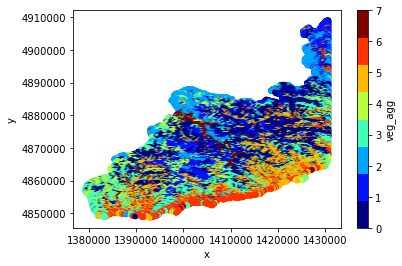

In [64]:
#We perform a mapping from 0 to  7,  in  order to have  numbers more easy to deal with
mapping = {34.0: 0, 35.0: 1, 333.0 : 2, 37.0: 3, 32.0 : 4, 23.0 : 5, 21.0 : 6, 22.0 : 7}
geog = geog.replace({"veg_agg": mapping})

cmap = plt.get_cmap('jet', 8)   #We select a colormap  with just 8 colors (one for each category)

# We plot  every pixel,  coloring it according to its fuel category
geog.plot.scatter("x","y", cmap = cmap, c = "veg_agg")  


In [65]:
# Now  we performed a mapping and  we  check  the content of the aggregated vegetation column
geog["veg_agg"].value_counts()

0.0    41575
3.0    22942
5.0    16451
1.0    15677
2.0    12523
4.0    11383
6.0     7868
7.0     4509
Name: veg_agg, dtype: int64

In [66]:
# Now we print the different column labels of our  geographical  database, along with  some other info

print(geog.columns)
print(".............................")
print(".............................")
print(".............................")

print(geog.info())

Index(['point_index', 'point_index.1', 'row', 'col', 'x', 'y', 'dem', 'slope',
       'north', 'east', 'veg', 'veg_agg', 'veg_type', 'urban_d', 'roads_d',
       'crops_d', 'park', 'tracks_d'],
      dtype='object')
.............................
.............................
.............................
<class 'pandas.core.frame.DataFrame'>
Int64Index: 132928 entries, 227053 to 492277
Data columns (total 18 columns):
point_index      132928 non-null int64
point_index.1    132928 non-null int64
row              132928 non-null int64
col              132928 non-null int64
x                132928 non-null float64
y                132928 non-null float64
dem              132928 non-null float64
slope            132928 non-null float64
north            132928 non-null float64
east             132928 non-null float64
veg              132928 non-null object
veg_agg          132928 non-null float64
veg_type         132928 non-null object
urban_d          132928 non-null float64
roads_d       

In [67]:
# We drop the columns that are not going to be used in the analysis

geog = geog.drop(["point_index.1", "row","col","north","east","veg","veg_type"], axis = 1)

In [68]:
# now we have a  cleaner database. Let us  have a closer look
geog.head()

,point_index,x,y,dem,slope,veg_agg,urban_d,roads_d,crops_d,park,tracks_d
227053,227053,1430378.27,4909084.1,855.077,12.836075,0.0,2137.7559,2137.7559,2061.5527,1.0,3106.4448
227054,227054,1430478.27,4909084.1,826.031,11.479017,0.0,2121.3203,2121.3203,2061.5527,1.0,3006.6594
227055,227055,1430578.27,4909084.1,810.000,9.201300,0.0,2109.5022,2109.5022,2039.6078,1.0,2906.8884
227056,227056,1430678.27,4909084.1,824.728,11.558707,0.0,2102.3796,2102.3796,2022.3749,1.0,2807.1338
227714,227714,1430178.27,4908984.1,904.998,13.343577,1.0,2088.0613,2088.0613,1923.5385,1.0,3280.2441


**Fires database**

The database about fires in Liguria region is contained in the file  "data_ML/fires.csv". 
For each  fire event (labeled with the column *fire_index*) we have the date (*data*), the season (*stagione*),  the area in  hectarias (*area_ha*), the year (*anno*).
Any pixel affected by  a fire event has a  different line-entry in the database. 

A pixel (identified  by a point_index and its x-y coordinates in Gauss-Boaga projection) can be affected different times by different fire events, so  it may appear more times in the database, with different *date* and *fire_index*.

In [69]:
#we open the fires database 
fires = pd.read_csv("data_ML/fires.csv")
#we print the lenght of  a column of the database
print(len(fires.point_index))
#we  cut the part of the database that is not in our considered westmost part  of Liguria 
fires = fires[fires.x < mm]
print(len(fires.point_index))
fires.head(90)

106919
44800


,point_index,x,y,fire_index,data,anno,stagione,area_ha
43970,240419,1430678.27,4907084.1,1874,2000-02-18,2000,1,0.246400
43972,241066,1430678.27,4906984.1,1874,2000-02-18,2000,1,0.246400
44585,250539,1427178.27,4905484.1,5570,2007-09-19,2007,2,0.082884
44586,250540,1427278.27,4905484.1,5570,2007-09-19,2007,2,0.082884
46575,267479,1427478.27,4902684.1,4173,2003-12-26,2003,1,0.598547
...,...,...,...,...,...,...,...,...
55527,333339,1427778.27,4890484.1,4661,2005-02-16,2005,1,51.438600
55528,333340,1427878.27,4890484.1,4661,2005-02-16,2005,1,51.438600
55529,333341,1427978.27,4890484.1,4661,2005-02-16,2005,1,51.438600
55530,333342,1428078.27,4890484.1,4661,2005-02-16,2005,1,51.438600


In [70]:
#geog[geog.point_index == 6937].y

# we remove columns not used in our  analysis

fires = fires.drop(["data","anno"],axis = 1)

In [71]:
#we have a closer look
fires.head()

,point_index,x,y,fire_index,stagione,area_ha
43970,240419,1430678.27,4907084.1,1874,1,0.246400
43972,241066,1430678.27,4906984.1,1874,1,0.246400
44585,250539,1427178.27,4905484.1,5570,2,0.082884
44586,250540,1427278.27,4905484.1,5570,2,0.082884
46575,267479,1427478.27,4902684.1,4173,1,0.598547


In [72]:
fires.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 44800 entries, 43970 to 106918
Data columns (total 6 columns):
point_index    44800 non-null int64
x              44800 non-null float64
y              44800 non-null float64
fire_index     44800 non-null int64
stagione       44800 non-null int64
area_ha        44800 non-null float64
dtypes: float64(3), int64(3)
memory usage: 2.4 MB


In [73]:
#since we will perform a lot of operations on the database, we shall work on a separate file, copied from "fires"
data  = fires.copy()

In [74]:
# ll is the lenght of  our fire database
ll = data.x.shape[0]
print(ll)
#since we want geographical data in our database, we  remind the labels of the geographical database
geog.columns

44800


Index(['point_index', 'x', 'y', 'dem', 'slope', 'veg_agg', 'urban_d',
       'roads_d', 'crops_d', 'park', 'tracks_d'],
      dtype='object')

In [75]:
#this is a first attempt to  get an array with  the desired values 'dem', 'slope', 'veg_agg', 'urban_d',
#'roads_d', 'crops_d', 'park', 'tracks_d'  connected to a specific point index (241066)

geog.loc[geog["point_index"] == 241066][['dem', 'slope', 'veg_agg', 'urban_d',
                                        'roads_d', 'crops_d', 'park', 'tracks_d']].values

array([[6.0587100e+02, 1.8061146e+01, 1.0000000e+00, 1.0000000e+02,
        1.0000000e+02, 1.0000000e+02, 0.0000000e+00, 1.7000000e+03]])

In [76]:
# for every entry  in the data database, we get the desired geographical values and we  store  it in 
#a tempory  numpy array.

temp = np.zeros([ll,8])
iii = 0
for ii in data.point_index.values:
    temp[iii, :] =  geog.loc[geog["point_index"] == ii][['dem', 'slope', 'veg_agg', 'urban_d','roads_d', 'crops_d', 'park', 'tracks_d']].values    
    iii = iii + 1 

In [77]:
#Now we merge  the data about fires, stored in "data", with the related  geographical information,  that 
#was stored  in  geog and  then put in the correct row of the temporary  array "temp"


data["dem"] = temp[:,0]
data["slope"] = temp[:,1]
data["veg_agg"] = temp[:,2]
data["urban_d"] = temp[:,3]
data["roads_d"] = temp[:,4]
data["crops_d"] = temp[:,5]
data["park"] = temp[:,6]
data["tracks_d"] = temp[:,7]

In [78]:
# what do we have now in data?

data.head()

,point_index,x,y,fire_index,stagione,area_ha,dem,slope,veg_agg,urban_d,roads_d,crops_d,park,tracks_d
43970,240419,1430678.27,4907084.1,1874,1,0.246400,616.715,18.436295,1.0,141.42136,141.42136,141.42136,0.0,1749.2855
43972,241066,1430678.27,4906984.1,1874,1,0.246400,605.871,18.061146,1.0,100.00000,100.00000,100.00000,0.0,1700.0000
44585,250539,1427178.27,4905484.1,5570,2,0.082884,695.521,18.617996,0.0,905.53860,0.00000,538.51650,0.0,3966.1064
44586,250540,1427278.27,4905484.1,5570,2,0.082884,726.650,19.851675,0.0,1004.98755,0.00000,632.45557,0.0,3883.2979
46575,267479,1427478.27,4902684.1,4173,1,0.598547,923.844,28.967241,1.0,721.11020,583.09515,1788.85440,1.0,2915.4760


**HOW TO DEAL WITH CATEGORICAL VARIABLES?**


In [79]:
#WE CREATE 8 MORE COLUMNS WITH BINARY INFORMATION ABOUT OUR WHEREABOUTS
#in  order to  do  this, we  use the OneHotEncoder of scikit-learn that converts the  numeric label we provide
#to   different 0-1  columns
from sklearn.preprocessing import OneHotEncoder
onehot_encoder = OneHotEncoder(sparse=False)
my_n = len(data["veg_agg"].values)
onehot_encoded = onehot_encoder.fit_transform(data["veg_agg"].values.reshape(my_n, 1))
#the first column is 1  only if we have veg number 1 ...


print(onehot_encoded)


[[0. 1. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


/home/andrea/miniconda3/envs/myprop/lib/python3.7/site-packages/sklearn/preprocessing/_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


In [80]:
#We add the recently produced  columns to our  dataframe  data !
#please note the label that is basically "is_veg_X" with  X varying from 0  to 7.
for  ii in range(onehot_encoded.shape[1]):
    lab = "is_veg_"+str(ii)
    data[lab] = onehot_encoded[:,ii]
data.head()

,point_index,x,y,fire_index,stagione,area_ha,dem,slope,veg_agg,urban_d,...,park,tracks_d,is_veg_0,is_veg_1,is_veg_2,is_veg_3,is_veg_4,is_veg_5,is_veg_6,is_veg_7
43970,240419,1430678.27,4907084.1,1874,1,0.246400,616.715,18.436295,1.0,141.42136,...,0.0,1749.2855,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
43972,241066,1430678.27,4906984.1,1874,1,0.246400,605.871,18.061146,1.0,100.00000,...,0.0,1700.0000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
44585,250539,1427178.27,4905484.1,5570,2,0.082884,695.521,18.617996,0.0,905.53860,...,0.0,3966.1064,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
44586,250540,1427278.27,4905484.1,5570,2,0.082884,726.650,19.851675,0.0,1004.98755,...,0.0,3883.2979,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
46575,267479,1427478.27,4902684.1,4173,1,0.598547,923.844,28.967241,1.0,721.11020,...,1.0,2915.4760,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [81]:
#We see the dataframe information resume
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 44800 entries, 43970 to 106918
Data columns (total 22 columns):
point_index    44800 non-null int64
x              44800 non-null float64
y              44800 non-null float64
fire_index     44800 non-null int64
stagione       44800 non-null int64
area_ha        44800 non-null float64
dem            44800 non-null float64
slope          44800 non-null float64
veg_agg        44800 non-null float64
urban_d        44800 non-null float64
roads_d        44800 non-null float64
crops_d        44800 non-null float64
park           44800 non-null float64
tracks_d       44800 non-null float64
is_veg_0       44800 non-null float64
is_veg_1       44800 non-null float64
is_veg_2       44800 non-null float64
is_veg_3       44800 non-null float64
is_veg_4       44800 non-null float64
is_veg_5       44800 non-null float64
is_veg_6       44800 non-null float64
is_veg_7       44800 non-null float64
dtypes: float64(19), int64(3)
memory usage: 7.9 MB


In [82]:
# in data  I have too  much information. I want to perform Machine  Learning with  10 000 pixel affected at some  
#point in space and  time by forest fire,  and  10000 "safe" points that were  never affected by fires (at least  according to  my database)
data = data.sample(n=10000)

In [83]:
help(data.sample)

Help on method sample in module pandas.core.generic:

sample(n=None, frac=None, replace=False, weights=None, random_state=None, axis=None) method of pandas.core.frame.DataFrame instance
    Return a random sample of items from an axis of object.
    
    You can use `random_state` for reproducibility.
    
    Parameters
    ----------
    n : int, optional
        Number of items from axis to return. Cannot be used with `frac`.
        Default = 1 if `frac` = None.
    frac : float, optional
        Fraction of axis items to return. Cannot be used with `n`.
    replace : bool, default False
        Sample with or without replacement.
    weights : str or ndarray-like, optional
        Default 'None' results in equal probability weighting.
        If passed a Series, will align with target object on index. Index
        values in weights not found in sampled object will be ignored and
        index values in sampled object not in weights will be assigned
        weights of zero.
      

In [84]:
# We put in the dataframe "aggiunte" the safe pixels.

#aggiunte = geog.loc[(df['column_name'] >= A) & (df['column_name'] <= B)]

# please note that with the minus "-" we transform True in False  and viceversa. 
# with "loc"  we restrain ourselves to the points  that are not into  the point indices of the  fire database
# isin gives True and False, with the  minus we switch the boolean representation and select the points that are  not present
aggiunte =  geog.loc[-geog.point_index.isin(fires.point_index)]
aggiunte = aggiunte.sample(n = 10000)



In [85]:
aggiunte.head()

,point_index,x,y,dem,slope,veg_agg,urban_d,roads_d,crops_d,park,tracks_d
476665,476665,1406078.27,4856884.1,255.025,28.536783,4.0,300.00000,670.82040,100.0000,0.0,1603.12200
481356,481356,1405678.27,4855484.1,191.050,12.460472,3.0,223.60680,200.00000,100.0000,0.0,761.57733
415771,415771,1394678.27,4871784.1,1485.863,24.524664,2.0,282.84270,0.00000,3101.6125,1.0,5060.63230
392171,392171,1423178.27,4877684.1,305.782,27.402864,0.0,360.55510,223.60680,223.6068,0.0,0.00000
250525,250525,1425478.27,4905484.1,549.922,17.379900,1.0,141.42136,141.42136,447.2136,0.0,5462.60000


In [86]:
# The safe point database needs to be polished, adding the encoding for point  variables and  the "0"  burnt area

my_n = len(aggiunte["veg_agg"].values)
onehot_encoded = onehot_encoder.fit_transform(aggiunte["veg_agg"].values.reshape(my_n, 1))
#the first column is 1  only if we have veg number 1 ...


print(onehot_encoded)


[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]]


/home/andrea/miniconda3/envs/myprop/lib/python3.7/site-packages/sklearn/preprocessing/_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


In [87]:
#We add the recently produced  columns to our  dataframe!
for  ii in range(onehot_encoded.shape[1]):
    lab = "is_veg_"+str(ii)
    aggiunte[lab] = onehot_encoded[:,ii]
aggiunte.head()

,point_index,x,y,dem,slope,veg_agg,urban_d,roads_d,crops_d,park,tracks_d,is_veg_0,is_veg_1,is_veg_2,is_veg_3,is_veg_4,is_veg_5,is_veg_6,is_veg_7
476665,476665,1406078.27,4856884.1,255.025,28.536783,4.0,300.00000,670.82040,100.0000,0.0,1603.12200,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
481356,481356,1405678.27,4855484.1,191.050,12.460472,3.0,223.60680,200.00000,100.0000,0.0,761.57733,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
415771,415771,1394678.27,4871784.1,1485.863,24.524664,2.0,282.84270,0.00000,3101.6125,1.0,5060.63230,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
392171,392171,1423178.27,4877684.1,305.782,27.402864,0.0,360.55510,223.60680,223.6068,0.0,0.00000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
250525,250525,1425478.27,4905484.1,549.922,17.379900,1.0,141.42136,141.42136,447.2136,0.0,5462.60000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [88]:
aggiunte["area_ha"]  = np.zeros(len(aggiunte.point_index))

In [89]:
aggiunte.head()

,point_index,x,y,dem,slope,veg_agg,urban_d,roads_d,crops_d,park,tracks_d,is_veg_0,is_veg_1,is_veg_2,is_veg_3,is_veg_4,is_veg_5,is_veg_6,is_veg_7,area_ha
476665,476665,1406078.27,4856884.1,255.025,28.536783,4.0,300.00000,670.82040,100.0000,0.0,1603.12200,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
481356,481356,1405678.27,4855484.1,191.050,12.460472,3.0,223.60680,200.00000,100.0000,0.0,761.57733,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
415771,415771,1394678.27,4871784.1,1485.863,24.524664,2.0,282.84270,0.00000,3101.6125,1.0,5060.63230,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
392171,392171,1423178.27,4877684.1,305.782,27.402864,0.0,360.55510,223.60680,223.6068,0.0,0.00000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
250525,250525,1425478.27,4905484.1,549.922,17.379900,1.0,141.42136,141.42136,447.2136,0.0,5462.60000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [90]:
#We merge two databases, the one about 10 000 pixels affected by fires and the one about 10 000 pixels that are  not affected by fires)
final_data = pd.concat([data, aggiunte])
final_data.head()

/home/andrea/miniconda3/envs/myprop/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  


,area_ha,crops_d,dem,fire_index,is_veg_0,is_veg_1,is_veg_2,is_veg_3,is_veg_4,is_veg_5,...,park,point_index,roads_d,slope,stagione,tracks_d,urban_d,veg_agg,x,y
86005,506.00900,538.51650,624.255,1312.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,456782,1400.00000,22.369732,1.0,1300.0000,1526.43370,0.0,1408678.27,4861984.1
104261,3.58856,100.00000,421.558,7625.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,481778,100.00000,17.615294,2.0,1140.1754,1004.98755,3.0,1388278.27,4855284.1
95678,6.00420,200.00000,354.661,2139.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,462819,500.00000,18.960346,2.0,2024.8457,824.62110,3.0,1414078.27,4860484.1
101211,5.37847,141.42136,382.153,764.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,473413,447.21360,13.150933,1.0,223.6068,316.22778,3.0,1413478.27,4857784.1
101514,74.45910,360.55510,640.000,7430.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,476287,608.27625,2.324539,1.0,1581.1388,761.57733,3.0,1403178.27,4856984.1


In [91]:
#To perform the analysis, we want to predict if  the pixel  is dangerous or  not, and for the training dataset 
#we  thus need  a binary information, separating the safe pixels  (with related burnt area = 0 ) from the dangerous ones
# with a related fire event of more than "th" hectarias (th set to 0.001 in this example)

th = 0.001
final_data["area_ha"] = final_data["area_ha"] > th 

In [92]:
final_data.head()

,area_ha,crops_d,dem,fire_index,is_veg_0,is_veg_1,is_veg_2,is_veg_3,is_veg_4,is_veg_5,...,park,point_index,roads_d,slope,stagione,tracks_d,urban_d,veg_agg,x,y
86005,True,538.51650,624.255,1312.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,456782,1400.00000,22.369732,1.0,1300.0000,1526.43370,0.0,1408678.27,4861984.1
104261,True,100.00000,421.558,7625.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,481778,100.00000,17.615294,2.0,1140.1754,1004.98755,3.0,1388278.27,4855284.1
95678,True,200.00000,354.661,2139.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,462819,500.00000,18.960346,2.0,2024.8457,824.62110,3.0,1414078.27,4860484.1
101211,True,141.42136,382.153,764.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,473413,447.21360,13.150933,1.0,223.6068,316.22778,3.0,1413478.27,4857784.1
101514,True,360.55510,640.000,7430.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,476287,608.27625,2.324539,1.0,1581.1388,761.57733,3.0,1403178.27,4856984.1


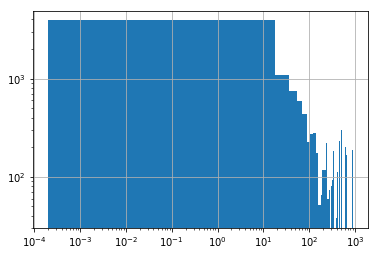

In [93]:
# We plot  the hectarias of burnt area,  in loglog scale in order to see a power-law slope
fig, ax = plt.subplots()
data["area_ha"].hist(ax=ax, bins = 50)
ax.set_yscale('log')
ax.set_xscale("log")

In [94]:
final_data.columns

Index(['area_ha', 'crops_d', 'dem', 'fire_index', 'is_veg_0', 'is_veg_1',
       'is_veg_2', 'is_veg_3', 'is_veg_4', 'is_veg_5', 'is_veg_6', 'is_veg_7',
       'park', 'point_index', 'roads_d', 'slope', 'stagione', 'tracks_d',
       'urban_d', 'veg_agg', 'x', 'y'],
      dtype='object')

In [95]:
#we finish polishing our final_data, that is almost ready to perform a Decision Tree or a Random Forest

final_data  =  final_data.drop(["fire_index","point_index", "veg_agg", "stagione"], axis=1)

final_data.columns

Index(['area_ha', 'crops_d', 'dem', 'is_veg_0', 'is_veg_1', 'is_veg_2',
       'is_veg_3', 'is_veg_4', 'is_veg_5', 'is_veg_6', 'is_veg_7', 'park',
       'roads_d', 'slope', 'tracks_d', 'urban_d', 'x', 'y'],
      dtype='object')

# Decision tree classifier

In [96]:
from sklearn.tree import DecisionTreeClassifier
RSEED  = 500
tree = DecisionTreeClassifier(random_state=RSEED)



from sklearn.model_selection import train_test_split

# Extract the labels
# What does the pop function? gives  out the selected item  and removes from dataframe.
#try typing help(final_data.pop)
#the label for our decision tree and random forest  is the True -  False  description  of fire occurrence
labels = np.array(final_data.pop('area_ha'))

features = list(final_data.columns)
print(features)

# we  split the dataset into a training dataset and a test dataset, with 30 percent of data devoted to testing phase

#try to type  help(train_test_split) for more info


train, test, train_labels, test_labels = train_test_split(final_data, labels, 
                                                          stratify = labels,
                                                          test_size = 0.3, 
                                                          random_state = RSEED)





# we train our decision tree
tree.fit(train,train_labels)


print(f'Decision tree has {tree.tree_.node_count} nodes with maximum depth {tree.tree_.max_depth}.')

#libraries to plot the tree structure...
from sklearn.tree import export_graphviz

# Export as dot
export_graphviz(tree, 'tree.dot', rounded = True, 
                feature_names = features, 
                class_names = ['0', '1'], filled = True)

from subprocess import call
# Convert to png.  set Gdpi to a  higher value  to have a higher quality version.
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=100']);



from IPython.display import Image
Image('tree.png')


['crops_d', 'dem', 'is_veg_0', 'is_veg_1', 'is_veg_2', 'is_veg_3', 'is_veg_4', 'is_veg_5', 'is_veg_6', 'is_veg_7', 'park', 'roads_d', 'slope', 'tracks_d', 'urban_d', 'x', 'y']
Decision tree has 3053 nodes with maximum depth 32.


In [97]:
from sklearn.metrics import precision_score, recall_score, roc_auc_score, roc_curve
def evaluate_model(predictions, probs, train_predictions, train_probs):
    """Compare machine learning model to baseline performance.
    Computes statistics and shows ROC curve."""
    
    baseline = {}
    
    baseline['recall'] = recall_score(test_labels, [1 for _ in range(len(test_labels))])
    baseline['precision'] = precision_score(test_labels, [1 for _ in range(len(test_labels))])
    baseline['roc'] = 0.5
    
    results = {}
    
    results['recall'] = recall_score(test_labels, predictions)
    results['precision'] = precision_score(test_labels, predictions)
    results['roc'] = roc_auc_score(test_labels, probs)
    
    train_results = {}
    train_results['recall'] = recall_score(train_labels, train_predictions)
    train_results['precision'] = precision_score(train_labels, train_predictions)
    train_results['roc'] = roc_auc_score(train_labels, train_probs)
    
    for metric in ['recall', 'precision', 'roc']:
        print(f'{metric.capitalize()} Baseline: {round(baseline[metric], 2)} Test: {round(results[metric], 2)} Train: {round(train_results[metric], 2)}')
    
    # Calculate false positive rates and true positive rates
    base_fpr, base_tpr, _ = roc_curve(test_labels, [1 for _ in range(len(test_labels))])
    model_fpr, model_tpr, _ = roc_curve(test_labels, probs)

    plt.figure(figsize = (8, 6))
    plt.rcParams['font.size'] = 16
    
    # Plot both curves
    plt.plot(base_fpr, base_tpr, 'b', label = 'baseline')
    plt.plot(model_fpr, model_tpr, 'r', label = 'model')
    plt.legend();
    plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate'); plt.title('ROC Curves');

In [98]:
# Make probability predictions
train_probs = tree.predict_proba(train)[:, 1]
probs = tree.predict_proba(test)[:, 1]

train_predictions = tree.predict(train)
predictions = tree.predict(test)


from collections import Counter
print(Counter(probs))
print(Counter(predictions))

print(f'Train ROC AUC Score: {roc_auc_score(train_labels, train_probs)}')
print(f'Test ROC AUC  Score: {roc_auc_score(test_labels, probs)}')



Counter({1.0: 3040, 0.0: 2960})
Counter({True: 3040, False: 2960})
Train ROC AUC Score: 0.9999999897959175
Test ROC AUC  Score: 0.8528355947595105


Recall Baseline: 1.0 Test: 0.86 Train: 1.0
Precision Baseline: 0.5 Test: 0.85 Train: 1.0
Roc Baseline: 0.5 Test: 0.85 Train: 1.0


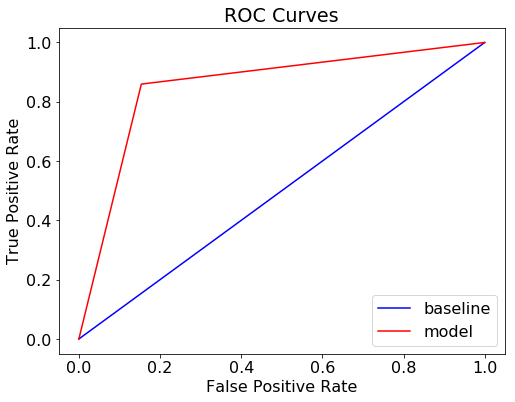

In [99]:
evaluate_model(predictions, probs, train_predictions, train_probs)

In [100]:
from sklearn.metrics import confusion_matrix
import itertools

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Oranges):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    Source: http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.figure(figsize = (10, 10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, size = 24)
    plt.colorbar(aspect=4)
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45, size = 14)
    plt.yticks(tick_marks, classes, size = 14)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    
    # Labeling the plot
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), fontsize = 20,
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
        
    plt.grid(None)
    plt.tight_layout()
    plt.ylabel('True label', size = 18)
    plt.xlabel('Predicted label', size = 18)


Confusion matrix, without normalization
[[2539  462]
 [ 421 2578]]


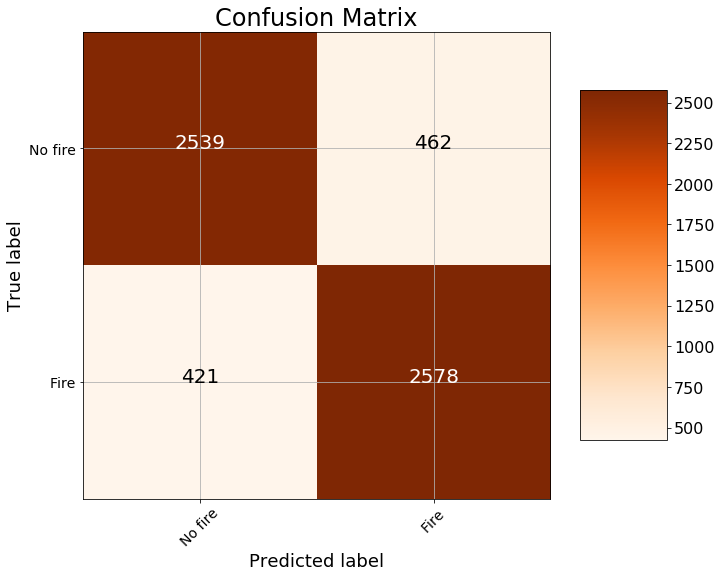

In [101]:
cm = confusion_matrix(test_labels, predictions)
plot_confusion_matrix(cm, classes = ['No fire', 'Fire'],
                      title = 'Confusion Matrix')

# Random Forest

In [102]:
#now we try to perform a random  forest 
from sklearn.ensemble import RandomForestClassifier

# Create the model with 100 trees
model = RandomForestClassifier(n_estimators=100, 
                               random_state=RSEED, 
                               max_features = 'sqrt',
                               n_jobs=-1, verbose = 1)

# Fit on training data
model.fit(train, train_labels)


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    1.0s finished


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='sqrt', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=500, verbose=1,
                       warm_start=False)

Average number of nodes 3299
Average maximum depth 27


[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.1s finished


Recall Baseline: 1.0 Test: 0.87 Train: 1.0
Precision Baseline: 0.5 Test: 0.9 Train: 1.0
Roc Baseline: 0.5 Test: 0.96 Train: 1.0


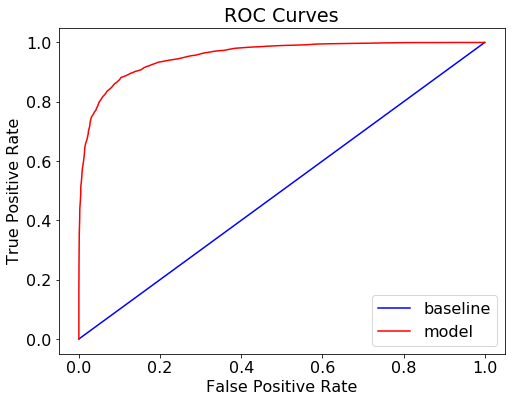

In [103]:
n_nodes = []
max_depths = []

for ind_tree in model.estimators_:
    n_nodes.append(ind_tree.tree_.node_count)
    max_depths.append(ind_tree.tree_.max_depth)
    
print(f'Average number of nodes {int(np.mean(n_nodes))}')
print(f'Average maximum depth {int(np.mean(max_depths))}')




train_rf_predictions = model.predict(train)
train_rf_probs = model.predict_proba(train)[:, 1]

rf_predictions = model.predict(test)
rf_probs = model.predict_proba(test)[:, 1]

evaluate_model(rf_predictions, rf_probs, train_rf_predictions, train_rf_probs)


Confusion matrix, without normalization
[[2700  301]
 [ 376 2623]]


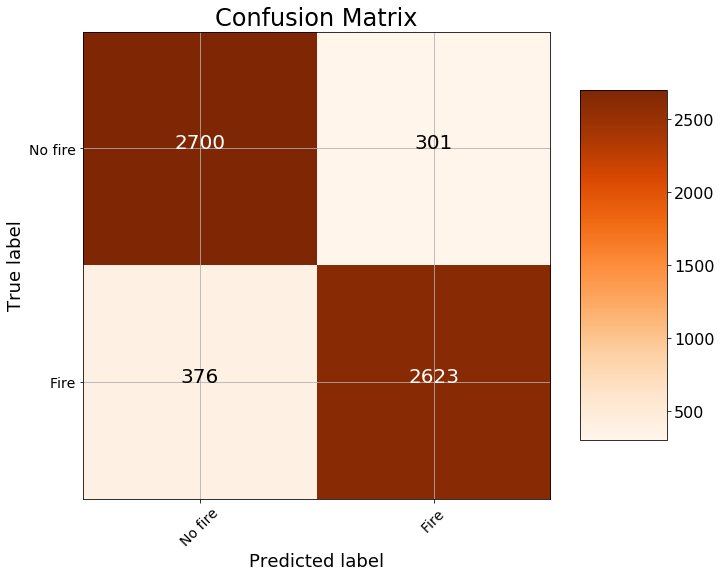

In [104]:
cm = confusion_matrix(test_labels, rf_predictions)
plot_confusion_matrix(cm, classes = ['No fire', 'Fire'],
                      title = 'Confusion Matrix')



In [105]:
### Random forest  has better performance than a single decision tree.

#### WE PLOT THE PREDICTED MAP over 6000 points chosen randomly in  the database. These points are in principle
# external to the ML algorithm.



raw_sam = geog.sample(6000)

raw_sam.head()


,point_index,x,y,dem,slope,veg_agg,urban_d,roads_d,crops_d,park,tracks_d
415872,415872,1404978.27,4871784.1,930.960,15.543523,0.0,905.53860,500.00000,824.6211,0.0,1389.24440
485817,485817,1390278.27,4853684.1,128.099,23.716890,0.0,632.45557,583.09515,100.0000,0.0,1341.64070
462502,462502,1425278.27,4860584.1,217.325,7.341217,3.0,141.42136,223.60680,200.0000,0.0,1627.88200
425924,425924,1426878.27,4869284.1,471.753,12.553321,3.0,500.00000,360.55510,282.8427,0.0,640.31244
275144,275144,1428978.27,4901384.1,825.278,8.983041,1.0,632.45557,500.00000,500.0000,0.0,2126.02930


In [106]:
# we process the raw sample of values where  we  want to cast the prediction.  
my_n = len(raw_sam["veg_agg"].values)
onehot_encoded = onehot_encoder.fit_transform(raw_sam["veg_agg"].values.reshape(my_n, 1))
#the first column is 1  only if we have veg number 0 ...
print(onehot_encoded)

#We add the recently produced  columns to our  dataframe!
for  ii in range(onehot_encoded.shape[1]):
    lab = "is_veg_"+str(ii)
    raw_sam[lab] = onehot_encoded[:,ii]
raw_sam.head()

raw_sam = raw_sam.drop(["point_index", "veg_agg"], axis = 1)


[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 1. 0.]
 [0. 1. 0. ... 0. 0. 0.]]


/home/andrea/miniconda3/envs/myprop/lib/python3.7/site-packages/sklearn/preprocessing/_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


In [107]:
#We want to feed the random forest predictor with some  point formatted the very same way of the training  data. 
#For this, we want an alphabetical order for the columns  labels.

raw_sam = raw_sam.reindex(sorted(raw_sam.columns), axis=1)
raw_sam.head()


,crops_d,dem,is_veg_0,is_veg_1,is_veg_2,is_veg_3,is_veg_4,is_veg_5,is_veg_6,is_veg_7,park,roads_d,slope,tracks_d,urban_d,x,y
415872,824.6211,930.960,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,500.00000,15.543523,1389.24440,905.53860,1404978.27,4871784.1
485817,100.0000,128.099,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,583.09515,23.716890,1341.64070,632.45557,1390278.27,4853684.1
462502,200.0000,217.325,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,223.60680,7.341217,1627.88200,141.42136,1425278.27,4860584.1
425924,282.8427,471.753,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,360.55510,12.553321,640.31244,500.00000,1426878.27,4869284.1
275144,500.0000,825.278,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,500.00000,8.983041,2126.02930,632.45557,1428978.27,4901384.1


In [108]:
#now that our 6000 points have the same formatting  as the points used in  the training, we can compute the risk map over  them

pred_probas = model.predict_proba(raw_sam.values)

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.1s finished


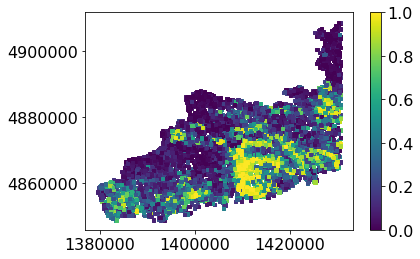

In [110]:
plt.scatter(raw_sam.x.values, raw_sam.y.values, marker = 's', s = 10.2, c = pred_probas[:,1])
plt.colorbar()

# Random Forest
From  now on, there are more technical algorithms: optimization  of the hyperparameters. Optional part.

In [45]:
from sklearn.model_selection import RandomizedSearchCV

# Hyperparameter grid
param_grid = {
    'n_estimators': np.linspace(10, 200).astype(int),
    'max_depth': [None] + list(np.linspace(3, 20).astype(int)),
    'max_features': ['auto', 'sqrt', None] + list(np.arange(0.5, 1, 0.1)),
    'max_leaf_nodes': [None] + list(np.linspace(10, 50, 500).astype(int)),
    'min_samples_split': [2, 5, 10],
    'bootstrap': [True, False]
}

# Estimator for use in random search
estimator = RandomForestClassifier(random_state = RSEED)

# Create the random search model
rs = RandomizedSearchCV(estimator, param_grid, n_jobs = -1, 
                        scoring = 'roc_auc', cv = 3, 
                        n_iter = 10, verbose = 1, random_state=RSEED)

# Fit 
rs.fit(train, train_labels)



Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   24.7s finished


RandomizedSearchCV(cv=3, error_score='raise-deprecating',
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
                                                    n_estimators='warn',
                                                    n_jobs=None

In [46]:
rs.best_params_
best_model = rs.best_estimator_
train_rf_predictions = best_model.predict(train)
train_rf_probs = best_model.predict_proba(train)[:, 1]

rf_predictions = best_model.predict(test)
rf_probs = best_model.predict_proba(test)[:, 1]




Confusion matrix, without normalization
[[2595  406]
 [ 716 2283]]


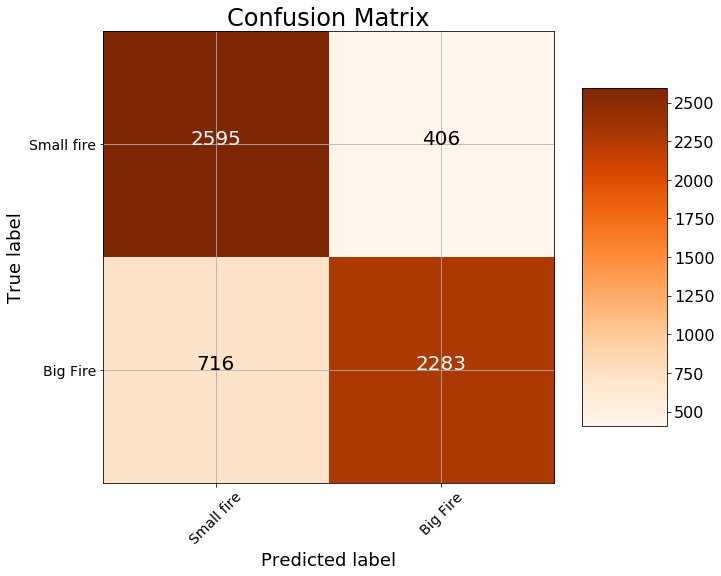

In [47]:
cm = confusion_matrix(test_labels, rf_predictions)
plot_confusion_matrix(cm, classes = ['Small fire', 'Big Fire'],
                      title = 'Confusion Matrix')


In [48]:
n_nodes = []
max_depths = []

for ind_tree in best_model.estimators_:
    n_nodes.append(ind_tree.tree_.node_count)
    max_depths.append(ind_tree.tree_.max_depth)
    
print(f'Average number of nodes {int(np.mean(n_nodes))}')
print(f'Average maximum depth {int(np.mean(max_depths))}')



Average number of nodes 83
Average maximum depth 9


Recall Baseline: 1.0 Test: 0.76 Train: 0.78
Precision Baseline: 0.5 Test: 0.85 Train: 0.85
Roc Baseline: 0.5 Test: 0.9 Train: 0.91


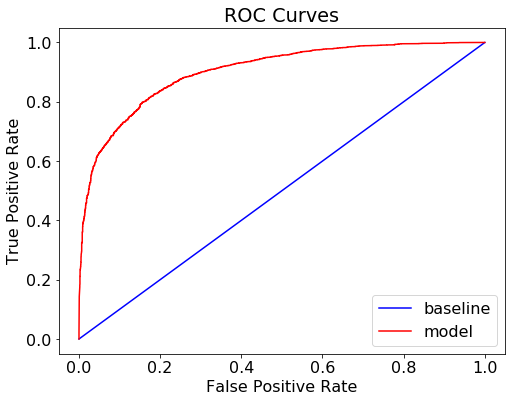

In [49]:
evaluate_model(rf_predictions, rf_probs, train_rf_predictions, train_rf_probs)


In [50]:
estimator = best_model.estimators_[1]

# Export a tree from the forest
export_graphviz(estimator, 'tree_from_optimized_forest.dot', rounded = True, 
                feature_names=train.columns, max_depth = 8, 
                class_names = ['small_fires', 'big_fires'], filled = True)

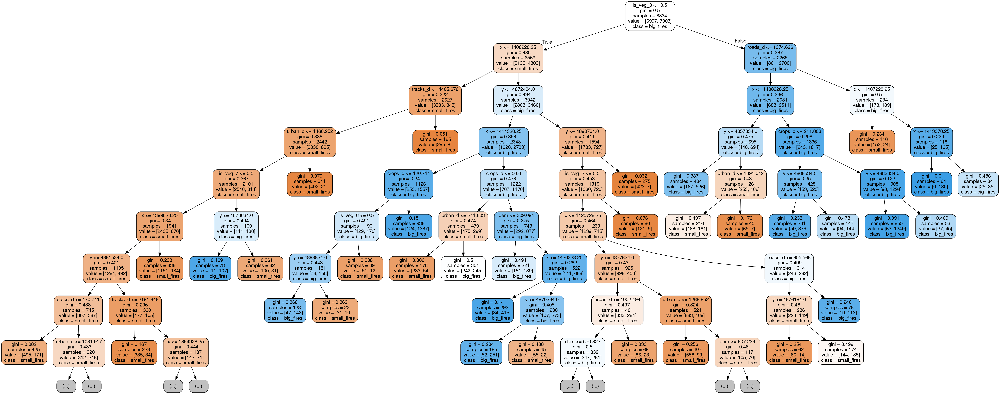

In [51]:
call(['dot', '-Tpng', 'tree_from_optimized_forest.dot', '-o', 'tree_from_optimized_forest.png', '-Gdpi=200'])
Image('tree_from_optimized_forest.png')